## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

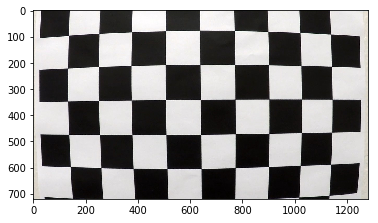

In [7]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

test_img = mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(test_img)

In [9]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
img_size = (img.shape[1], img.shape[0])


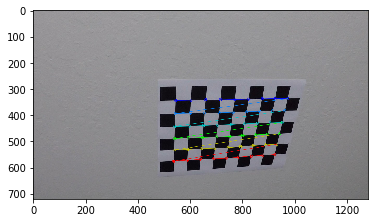

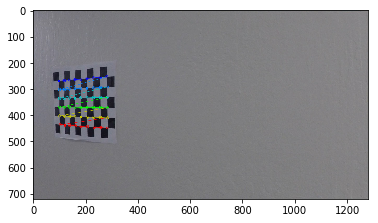

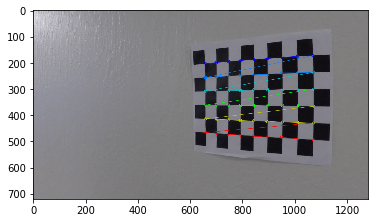

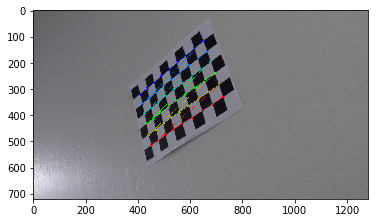

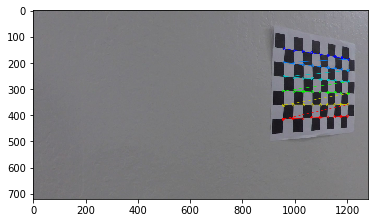

...

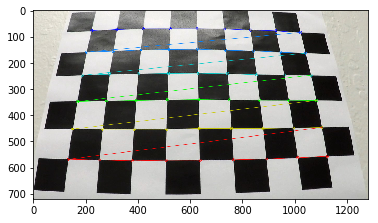

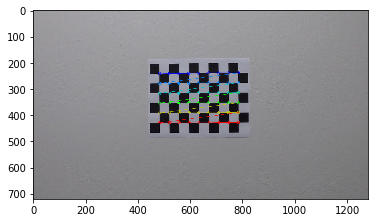

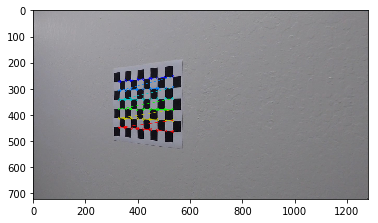

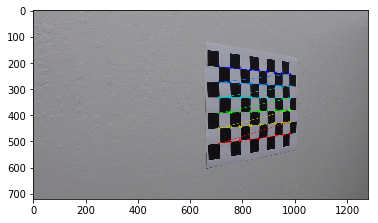

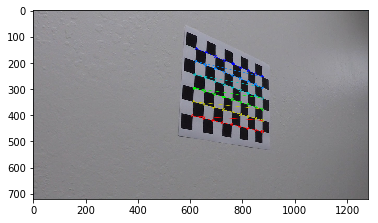

In [23]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        cv2.imwrite('output_images/calibration'+str(i)+'.jpg',img)

        plt.imshow(img)
        plt.show()


## Second, distortion

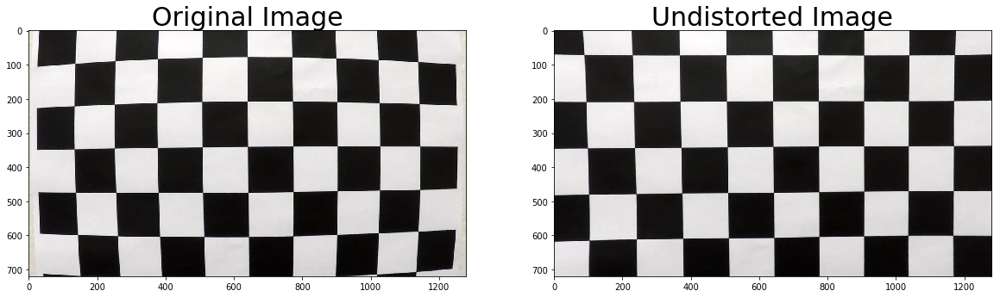

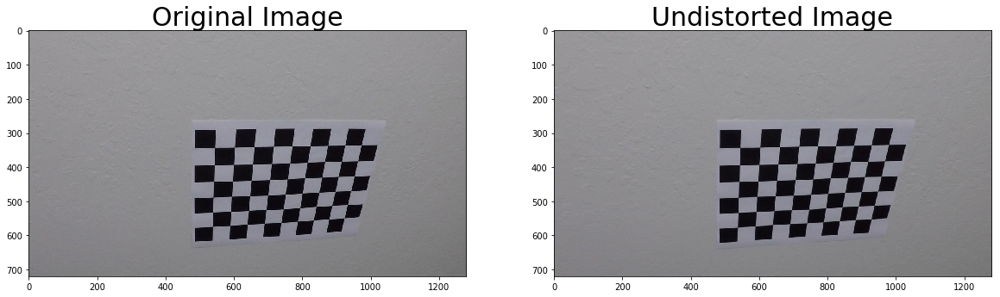

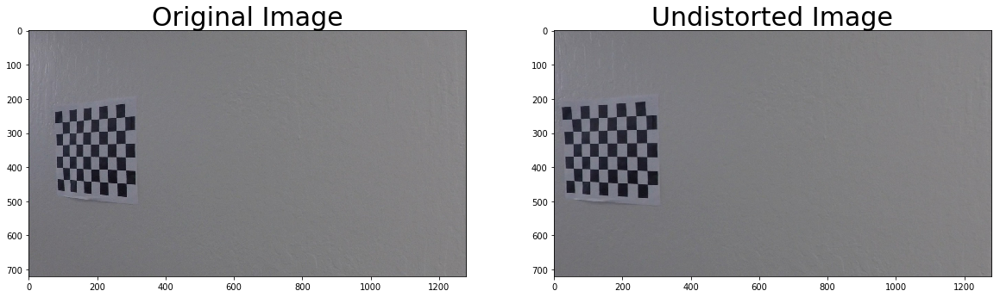

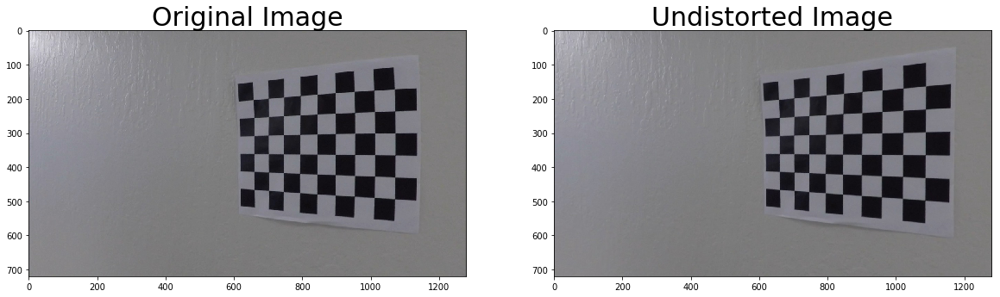

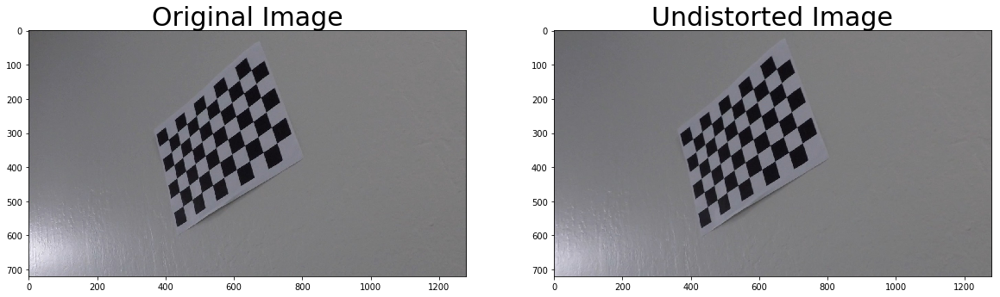

...

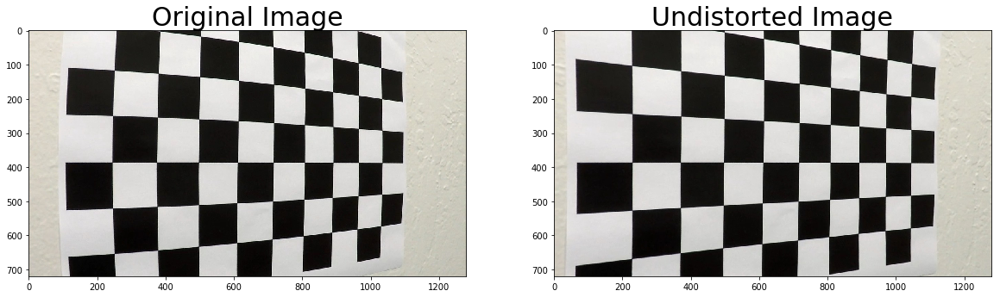

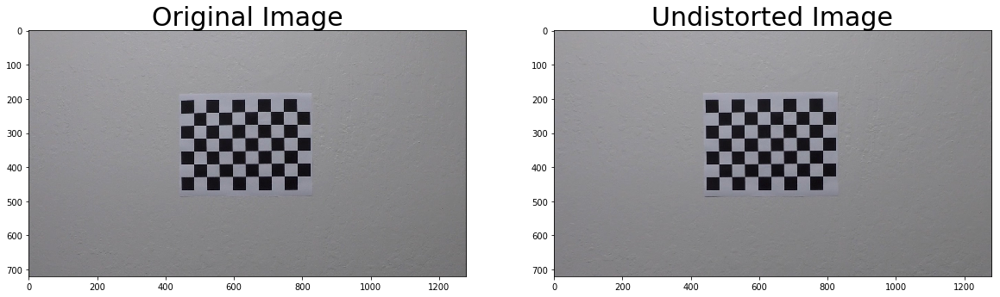

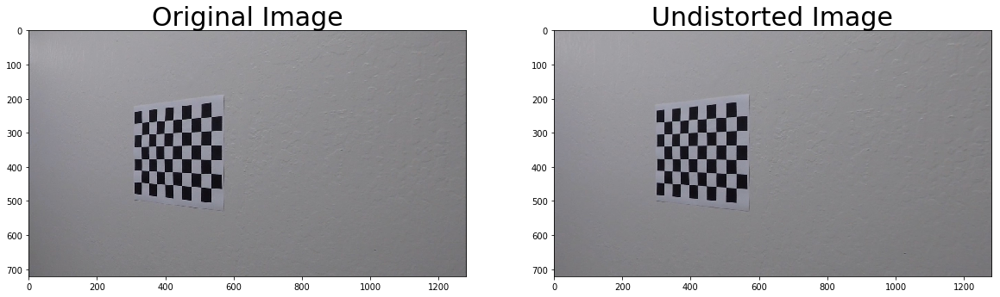

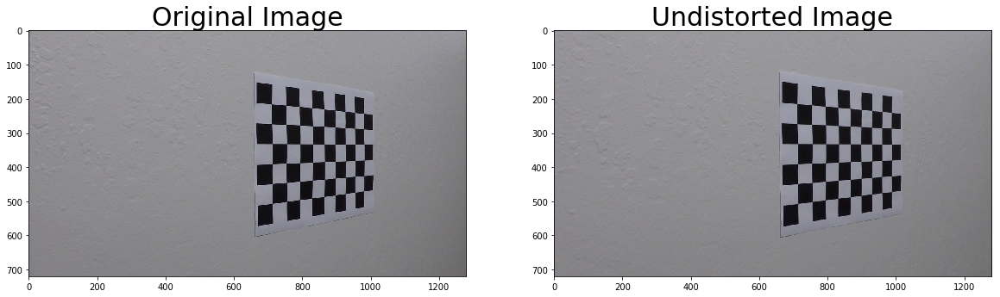

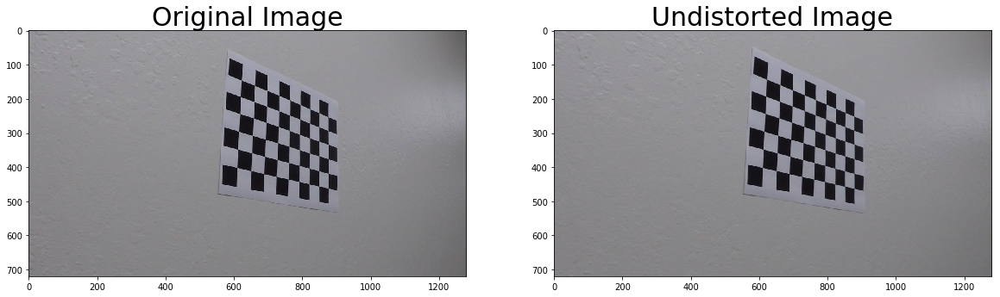

In [46]:
import pickle

for i, fname in enumerate(images):
    img = mpimg.imread(fname)

    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    cv2.imwrite('output_images/undist'+str(i)+'.jpg',undist)
    

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=30)


# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "output/wide_dist_pickle.p", "wb" ) )

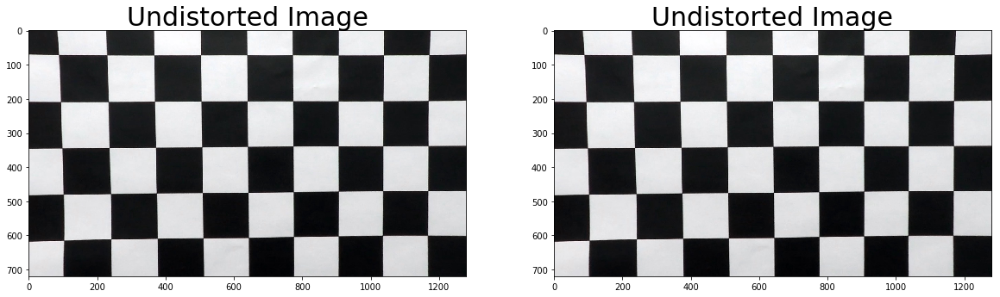

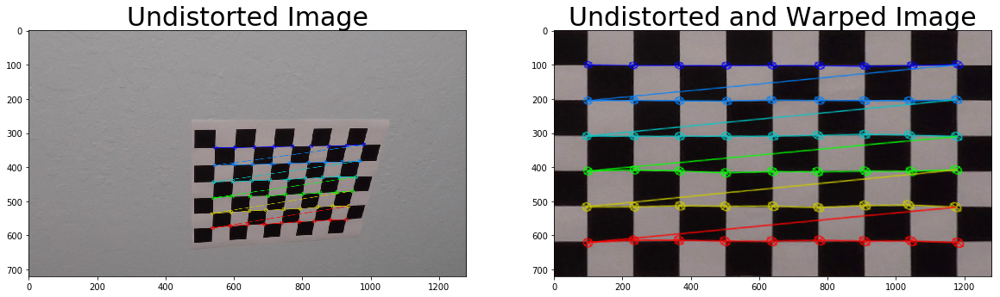

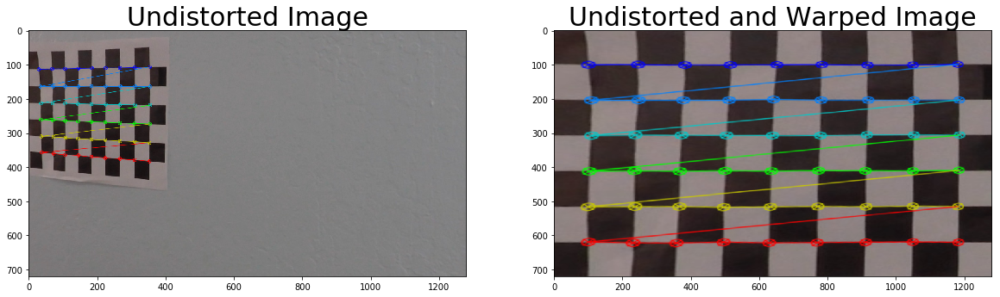

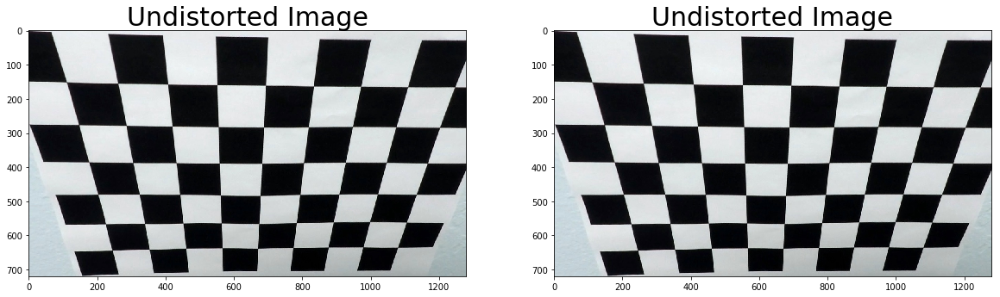

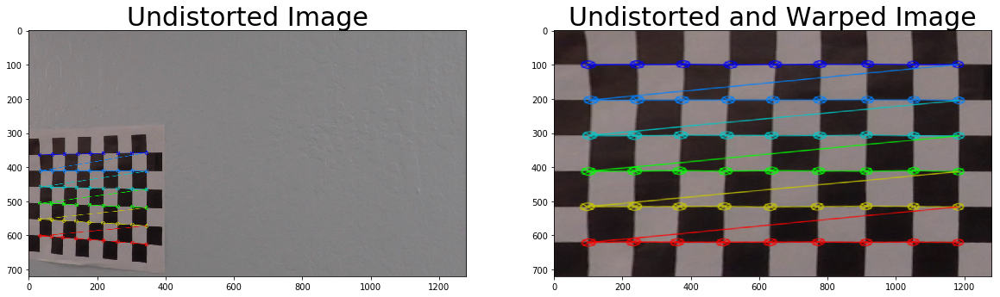

...

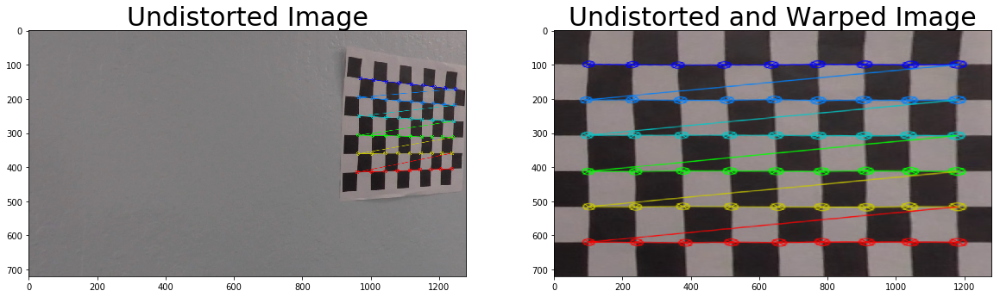

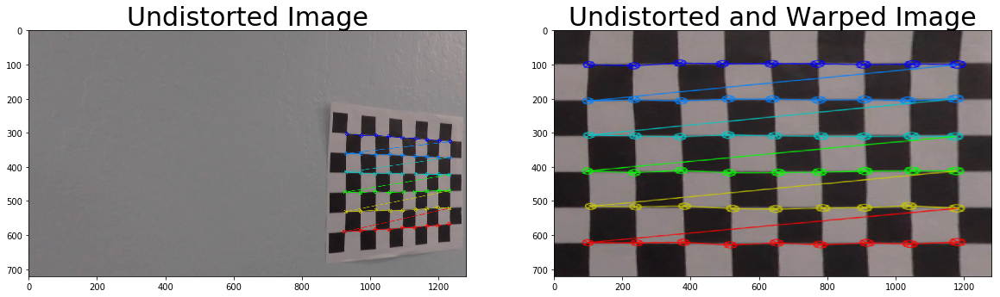

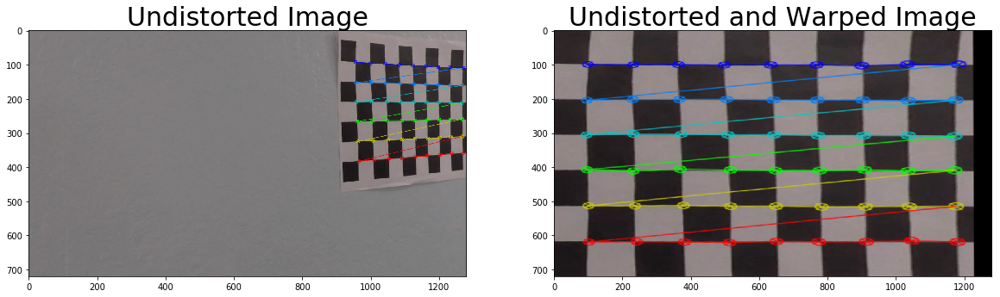

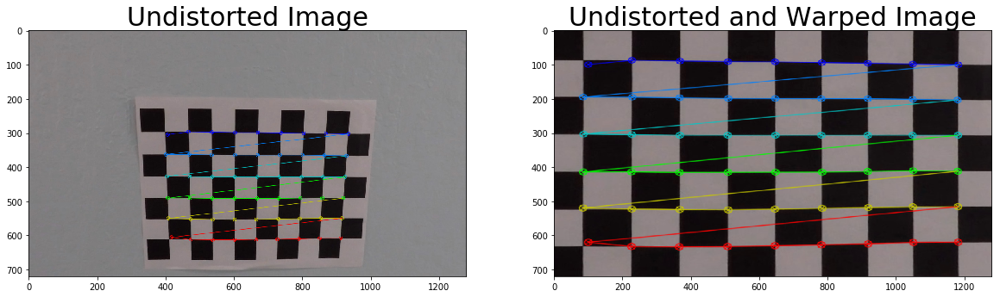

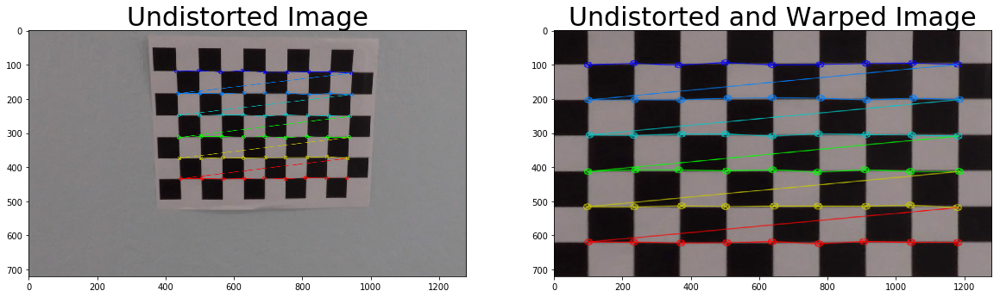

In [56]:
# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load( open( "output/wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
images = glob.glob('output_images/undist*.jpg')
for i, fname in enumerate(images):
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret == True:
        img2 = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        src = np.float32([corners[0],
                          corners[nx - 1], 
                          corners[ny*nx - nx], 
                          corners[ny*nx -1]])
        h,w = img.shape[:2]
        dst = np.float32([[100,100],[w-100,100],[100,h-100],[w-100,h-100]])
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(img2, M, (w,h), flags=cv2.INTER_LINEAR)

        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Undistorted Image', fontsize=30)
        ax2.imshow(warped)
        ax2.set_title('Undistorted and Warped Image', fontsize=30)
    else:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Undistorted Image', fontsize=30)
        ax2.imshow(img)
        ax2.set_title('Undistorted Image', fontsize=30)
    cv2.imwrite('output_images/undist_Warped'+str(i)+'.jpg',undist)
